In [1]:
#import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import requests
import folium
%matplotlib inline 

## Examine visible minority subset

In [2]:
#import COVID and demographic data, visible minority subset
dfvm=pd.read_csv('neighbourhood-profiles-2016VM.csv')

In [3]:
dfvm

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMAboriginal,VMLatinAmerica,VMSouthAsian,VMChinese,VMBlack,VMFilipino,VMArab,VMSoutheastAsian,VMWestAsian,VMKorean,VMJapanese,VMNotSpecified,VMMultiple,VMNot
0,Agincourt North,129,2109.023460,614,30,170,5315,16460,1340,1420,275,260,125,70,60,245,630,2465
1,Agincourt South-Malvern West,128,2134.107842,507,70,230,4190,11110,1545,1280,300,155,375,140,40,275,490,3320
2,Alderwood,20,1800.232288,217,180,180,540,275,300,615,90,55,20,65,35,140,180,9535
3,Annex,95,1821.398152,556,255,405,1125,2145,935,350,300,190,340,605,255,125,480,21380
4,Banbury-Don Mills,42,1346.813504,373,115,350,2825,4630,970,1135,550,110,755,560,210,155,470,14290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,180,445,255,805,865,440,95,165,55,135,60,70,260,9605
136,Yonge-Eglinton,100,981.636625,116,95,220,445,980,295,290,105,75,215,250,115,50,140,8650
137,Yonge-St.Clair,97,941.890166,118,95,160,560,575,235,230,125,50,190,135,115,65,120,9740
138,York University Heights,27,4943.282717,1364,170,1765,4180,1500,5205,2645,280,1375,605,390,30,535,620,8430


In [4]:
#split dataframe
dfvm1=dfvm[['Neighbourhood', 'NeighbourhoodNumber','Covid19Rate','Covid19CaseCount', 'VMAboriginal','VMLatinAmerica','VMBlack','VMArab','VMNotSpecified','VMMultiple', 'VMNot']]
dfvm1

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMAboriginal,VMLatinAmerica,VMBlack,VMArab,VMNotSpecified,VMMultiple,VMNot
0,Agincourt North,129,2109.023460,614,30,170,1340,275,245,630,2465
1,Agincourt South-Malvern West,128,2134.107842,507,70,230,1545,300,275,490,3320
2,Alderwood,20,1800.232288,217,180,180,300,90,140,180,9535
3,Annex,95,1821.398152,556,255,405,935,300,125,480,21380
4,Banbury-Don Mills,42,1346.813504,373,115,350,970,550,155,470,14290
...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,180,445,865,95,70,260,9605
136,Yonge-Eglinton,100,981.636625,116,95,220,295,105,50,140,8650
137,Yonge-St.Clair,97,941.890166,118,95,160,235,125,65,120,9740
138,York University Heights,27,4943.282717,1364,170,1765,5205,280,535,620,8430


In [5]:
dfvm1.describe

<bound method NDFrame.describe of                     Neighbourhood  NeighbourhoodNumber  Covid19Rate  \
0                 Agincourt North                  129  2109.023460   
1    Agincourt South-Malvern West                  128  2134.107842   
2                       Alderwood                   20  1800.232288   
3                           Annex                   95  1821.398152   
4               Banbury-Don Mills                   42  1346.813504   
..                            ...                  ...          ...   
135                      Wychwood                   94  1693.497805   
136                Yonge-Eglinton                  100   981.636625   
137                Yonge-St.Clair                   97   941.890166   
138       York University Heights                   27  4943.282717   
139            Yorkdale-Glen Park                   31  5052.688463   

     Covid19CaseCount  VMAboriginal  VMLatinAmerica  VMBlack  VMArab  \
0                 614            30      

In [21]:
#sort by COVID-19 cases per 1000000
sorted_dfvm1 = dfvm1.sort_values(by = 'Covid19Rate', ascending=False)
COVIDratetop10=sorted_dfvm1.head(10)
COVIDratebot10=sorted_dfvm1.tail(10)

In [22]:
COVIDratetop10

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMAboriginal,VMLatinAmerica,VMBlack,VMArab,VMNotSpecified,VMMultiple,VMNot
117,Thistletown-Beaumond Heights,3,6650.579151,689,50,660,1645,380,285,160,3615
81,Mount Olive-Silverstone-Jamestown,2,6463.555259,2130,205,1085,8390,2650,1445,610,4375
74,Maple Leaf,29,6201.167046,627,25,645,790,35,55,100,5565
13,Black Creek,24,6095.597369,1325,195,1780,6315,705,785,790,4125
55,Humbermede,22,5969.765198,928,90,1830,3440,155,400,290,3565
124,West Humber-Clairville,1,5586.575408,1861,150,1300,6260,240,1535,685,5940
54,Humber Summit,21,5565.399485,691,15,895,1835,205,235,170,4265
45,Glenfield-Jane Heights,25,5559.017415,1695,145,3680,7360,345,1435,1090,7065
126,Weston,113,5491.329480,988,200,1390,6045,120,280,390,6925
33,Downsview-Roding-CFB,26,5232.226406,1834,245,3605,5455,255,400,895,14945


In [28]:
COVIDratetop=COVIDratetop10[['Neighbourhood', 'Covid19Rate']]
COVIDratetop.set_index("Neighbourhood", inplace = True)
COVIDratetop

,Covid19Rate
Neighbourhood,
Thistletown-Beaumond Heights,6650.579151
Mount Olive-Silverstone-Jamestown,6463.555259
Maple Leaf,6201.167046
Black Creek,6095.597369
Humbermede,5969.765198
West Humber-Clairville,5586.575408
Humber Summit,5565.399485
Glenfield-Jane Heights,5559.017415
Weston,5491.329480


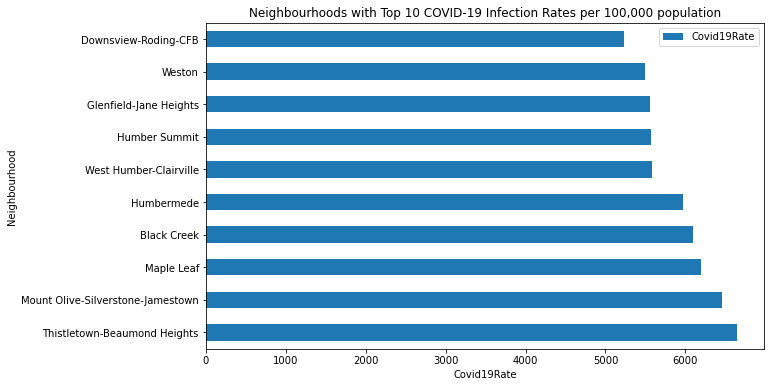

In [29]:
# step 2: plot data, top 10 neighbourhoods
COVIDratetop.plot(kind='barh', figsize=(10, 6))

plt.xlabel('Covid19Rate') # add to x-label to the plot
plt.ylabel('Neighbourhood') # add y-label to the plot
plt.title('Neighbourhoods with Top 10 COVID-19 Infection Rates per 100,000 population') # add title to the plot

plt.show()

In [23]:
COVIDratebot10

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMAboriginal,VMLatinAmerica,VMBlack,VMArab,VMNotSpecified,VMMultiple,VMNot
16,Bridle Path-Sunnybrook-York Mills,41,938.916469,87,10,65,115,40,10,110,6415
85,Newtonbrook East,50,938.062993,151,45,165,205,150,20,210,4320
69,Lawrence Park South,103,935.502998,142,70,110,240,30,50,185,12560
129,Willowdale East,51,854.582226,431,105,825,1135,1320,135,810,12545
82,Mount Pleasant East,99,846.497764,142,115,285,470,60,50,215,12930
104,Rosedale-Moore Park,98,831.620704,174,150,270,395,155,65,190,16880
133,Woodbine Corridor,64,813.332270,102,280,140,775,40,55,230,9050
44,Forest Hill South,101,810.659709,87,75,140,205,40,10,105,8820
106,Runnymede-Bloor West Village,89,645.481629,65,125,120,215,20,75,75,8465
116,The Beaches,63,625.956322,135,305,215,345,90,140,260,18465


In [32]:
COVIDratebot=COVIDratebot10[['Neighbourhood', 'Covid19Rate']]
COVIDratebot.set_index("Neighbourhood", inplace = True)
COVIDratebot

,Covid19Rate
Neighbourhood,
Bridle Path-Sunnybrook-York Mills,938.916469
Newtonbrook East,938.062993
Lawrence Park South,935.502998
Willowdale East,854.582226
Mount Pleasant East,846.497764
Rosedale-Moore Park,831.620704
Woodbine Corridor,813.332270
Forest Hill South,810.659709
Runnymede-Bloor West Village,645.481629


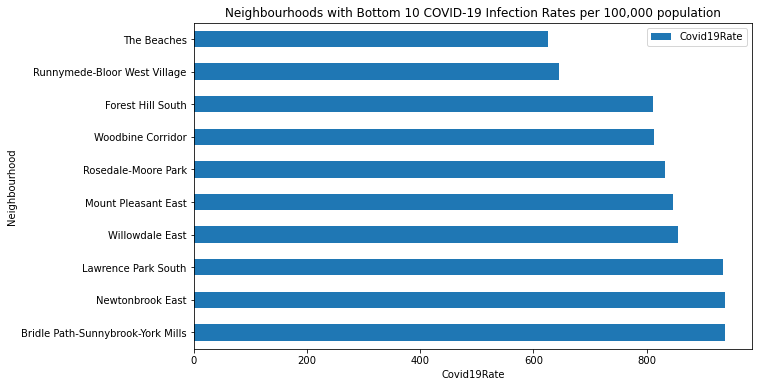

In [33]:
# step 2: plot data, bottom 10 neighbourhoods
COVIDratebot.plot(kind='barh', figsize=(10, 6))

plt.xlabel('Covid19Rate') # add to x-label to the plot
plt.ylabel('Neighbourhood') # add y-label to the plot
plt.title('Neighbourhoods with Bottom 10 COVID-19 Infection Rates per 100,000 population') # add title to the plot

plt.show()

In [34]:
#split dataframe
dfvm2=dfvm[['Neighbourhood', 'NeighbourhoodNumber','Covid19Rate','Covid19CaseCount','VMSouthAsian','VMChinese','VMFilipino','VMSoutheastAsian','VMWestAsian','VMKorean','VMJapanese']]
dfvm2

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMSouthAsian,VMChinese,VMFilipino,VMSoutheastAsian,VMWestAsian,VMKorean,VMJapanese
0,Agincourt North,129,2109.023460,614,5315,16460,1420,260,125,70,60
1,Agincourt South-Malvern West,128,2134.107842,507,4190,11110,1280,155,375,140,40
2,Alderwood,20,1800.232288,217,540,275,615,55,20,65,35
3,Annex,95,1821.398152,556,1125,2145,350,190,340,605,255
4,Banbury-Don Mills,42,1346.813504,373,2825,4630,1135,110,755,560,210
...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,255,805,440,165,55,135,60
136,Yonge-Eglinton,100,981.636625,116,445,980,290,75,215,250,115
137,Yonge-St.Clair,97,941.890166,118,560,575,230,50,190,135,115
138,York University Heights,27,4943.282717,1364,4180,1500,2645,1375,605,390,30


In [35]:
#examine correaltion 1
corr_vm1=dfvm1.corr()
corr_vm1

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMAboriginal,VMLatinAmerica,VMBlack,VMArab,VMNotSpecified,VMMultiple,VMNot
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.260068,-0.221717,0.022347,-0.070637,0.083444,0.183580,-0.073978
Covid19Rate,-0.160640,1.000000,0.730923,-0.096396,0.533566,0.654493,0.166010,0.493298,0.311711,-0.334786
Covid19CaseCount,-0.027007,0.730923,1.000000,0.223191,0.602199,0.851278,0.462577,0.778155,0.776954,0.040880
VMAboriginal,0.260068,-0.096396,0.223191,1.000000,0.173971,0.322458,0.206579,0.381450,0.435464,0.530763
VMLatinAmerica,-0.221717,0.533566,0.602199,0.173971,1.000000,0.649863,0.198034,0.431688,0.488615,0.192868
VMBlack,0.022347,0.654493,0.851278,0.322458,0.649863,1.000000,0.395387,0.806073,0.736919,-0.062478
VMArab,-0.070637,0.166010,0.462577,0.206579,0.198034,0.395387,1.000000,0.364912,0.524611,0.165470
VMNotSpecified,0.083444,0.493298,0.778155,0.381450,0.431688,0.806073,0.364912,1.000000,0.725973,-0.009871
VMMultiple,0.183580,0.311711,0.776954,0.435464,0.488615,0.736919,0.524611,0.725973,1.000000,0.229005
VMNot,-0.073978,-0.334786,0.040880,0.530763,0.192868,-0.062478,0.165470,-0.009871,0.229005,1.000000


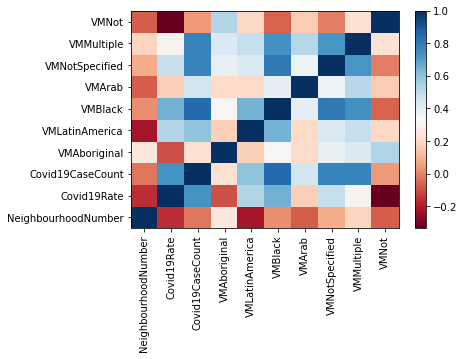

In [12]:
fig, ax = plt.subplots()
im = ax.pcolor(corr_vm1, cmap='RdBu')

#label names
row_labels = corr_vm1.columns
col_labels = corr_vm1.index

#move ticks and labels to the center
ax.set_xticks(np.arange(corr_vm1.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(corr_vm1.shape[0]) + 0.5, minor=False)

#insert labels
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

#rotate label if too long
plt.xticks(rotation=90)

fig.colorbar(im)
plt.show()

In [35]:
#examine correlation 2
corr_vm2=dfvm2.corr()
corr_vm2

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMSouthAsian,VMChinese,VMFilipino,VMSoutheastAsian,VMWestAsian,VMKorean,VMJapanese
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.238937,0.218038,0.172835,-0.171758,-0.120980,-0.179417,0.087104
Covid19Rate,-0.160640,1.000000,0.730923,0.377711,-0.194829,0.410632,0.458677,-0.013907,-0.216567,-0.423823
Covid19CaseCount,-0.027007,0.730923,1.000000,0.740276,0.083278,0.666958,0.519743,0.214637,-0.015151,-0.060593
VMSouthAsian,0.238937,0.377711,0.740276,1.000000,0.182574,0.537870,0.059744,0.278101,-0.021373,0.025877
VMChinese,0.218038,-0.194829,0.083278,0.182574,1.000000,0.083815,-0.014296,0.413517,0.408836,0.410311
VMFilipino,0.172835,0.410632,0.666958,0.537870,0.083815,1.000000,0.159245,0.234661,0.070573,-0.028514
VMSoutheastAsian,-0.171758,0.458677,0.519743,0.059744,-0.014296,0.159245,1.000000,0.024845,-0.035139,-0.044588
VMWestAsian,-0.120980,-0.013907,0.214637,0.278101,0.413517,0.234661,0.024845,1.000000,0.834930,0.494523
VMKorean,-0.179417,-0.216567,-0.015151,-0.021373,0.408836,0.070573,-0.035139,0.834930,1.000000,0.651388
VMJapanese,0.087104,-0.423823,-0.060593,0.025877,0.410311,-0.028514,-0.044588,0.494523,0.651388,1.000000


<Figure size 2880x1440 with 0 Axes>

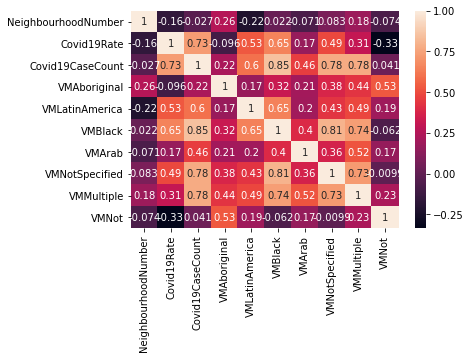

<Figure size 2880x1440 with 0 Axes>

In [36]:
#heatmap correaltion 1
sns.heatmap(corr_vm1, annot=True)

plt.figure(figsize=(40, 20))

<Figure size 2880x1440 with 0 Axes>

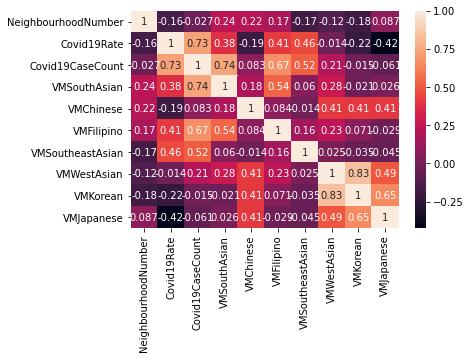

<Figure size 2880x1440 with 0 Axes>

In [37]:
#heatmap correaltion 2
sns.heatmap(corr_vm2, annot=True)

plt.figure(figsize=(40, 20))

### Visible minority observations
Certain visible minority populations have high COVID-19 rates per 1000000 people.  Highest correlations - VMBlack, VMLatinAmerican, VMUnspecified.
Certain visible minority populations have low COVID-19 rates per 1000000 people.  Lowest correlations - VMJapanese, VMNot, VMKorean.


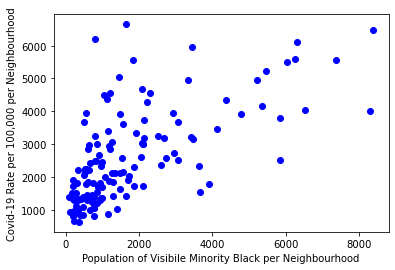

In [47]:
#scatterplot high correlation population
plt.scatter(dfvm1.VMBlack, dfvm1.Covid19Rate,  color='blue')
plt.xlabel("Population of Visibile Minority Black per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.show()

(0.0, 7461.801154885286)

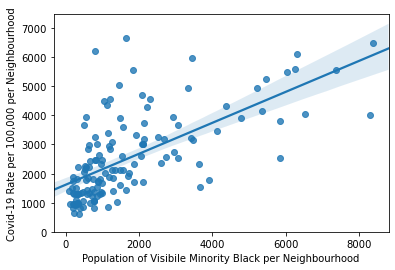

In [50]:
# VMBlack as a predictor of COVID-19 infections
sns.regplot(x="VMBlack", y="Covid19Rate", data=dfvm1)
plt.xlabel("Population of Visibile Minority Black per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

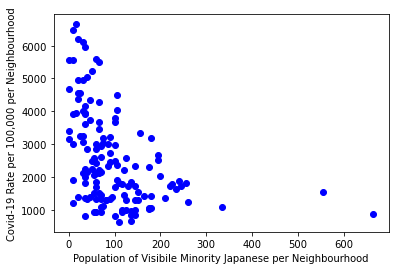

In [48]:
#scatterplot low correlation population
plt.scatter(dfvm2.VMJapanese, dfvm.Covid19Rate,  color='blue')
plt.xlabel("Population of Visibile Minority Japanese per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.show()

(0.0, 7223.796634641604)

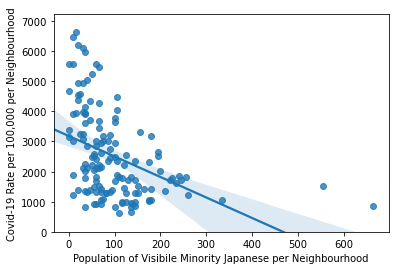

In [51]:
# VMBlack as a predictor of COVID-19 infections
sns.regplot(x="VMJapanese", y="Covid19Rate", data=dfvm)
plt.xlabel("Population of Visibile Minority Japanese per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

### Regression plot observations
Correlations make sense given regression plots.  As population VMBlack increases, so does COVID rate.  Population VMJapanese does not predict COVID rate.

## Map COVID19 distribution by neighbourhood

In [17]:
#Toronto lat long copied from previous lab
latitude=43.6534817
longitude=-79.3839347

In [4]:
#can reference visibile minority subset - neighbourhood and total COVID numbers within
dfvm.head()

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMAboriginal,VMLatinAmerica,VMSouthAsian,VMChinese,VMBlack,VMFilipino,VMArab,VMSoutheastAsian,VMWestAsian,VMKorean,VMJapanese,VMNotSpecified,VMMultiple,VMNot
0,Agincourt North,129,2109.023460,614,30,170,5315,16460,1340,1420,275,260,125,70,60,245,630,2465
1,Agincourt South-Malvern West,128,2134.107842,507,70,230,4190,11110,1545,1280,300,155,375,140,40,275,490,3320
2,Alderwood,20,1800.232288,217,180,180,540,275,300,615,90,55,20,65,35,140,180,9535
3,Annex,95,1821.398152,556,255,405,1125,2145,935,350,300,190,340,605,255,125,480,21380
4,Banbury-Don Mills,42,1346.813504,373,115,350,2825,4630,970,1135,550,110,755,560,210,155,470,14290


In [18]:
#import Toronto neighbourhoods Json file
Toronto_geo = r'Neighbourhoods.json' 

In [6]:
#generate a map with COVID-19 infection rates
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfvm['Covid19Rate'].min(),
                              dfvm['Covid19Rate'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
covid19ratemap = folium.Map(location=[latitude, longitude], zoom_start=11.45)
covid19ratemap.choropleth(
    geo_data=Toronto_geo,
    data=dfvm,
    columns=['NeighbourhoodNumber', 'Covid19Rate'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='COVID19 Rates per 100 000 People per Neighbourhood',
    reset=True
    )
covid19ratemap

In [56]:
#generate a map with population VBBlack
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfvm['VMBlack'].min(),
                              dfvm['VMBlack'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
popVMBlackmap = folium.Map(location=[latitude, longitude], zoom_start=11.45)
popVMBlackmap.choropleth(
    geo_data=Toronto_geo,
    data=dfvm,
    columns=['NeighbourhoodNumber', 'VMBlack'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Population of visible minority Black per Neighbourhood',
    reset=True
    )
popVMBlackmap

In [65]:
#generate a map with population VBJapanese
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfvm['VMJapanese'].min(),
                              dfvm['VMJapanese'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
popVMJapanesemap = folium.Map(location=[latitude, longitude], zoom_start=11.25)
popVMJapanesemap.choropleth(
    geo_data=Toronto_geo,
    data=dfvm,
    columns=['NeighbourhoodNumber', 'VMJapanese'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Population of visible minority Japanese per Neighbourhood',
    reset=True
    )
popVMJapanesemap

## Map observations
Map views support correaltions and regressions.  High rates of COVID-19 per 1000000 correlate with VMBlack, not VMJapanese

# Household Income considerations

In [7]:
#import COVID and demographic data, household income subset
dfhi=pd.read_csv('neighbourhood-profiles-2016HHincome.csv')

In [8]:
dfhi

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,HI0to5k,HI5to10k,HI10to15k,H$20to25k,HI25to30k,HI30to35k,HI35to40k,HI40to45k,HI45to50k,HI50to60k,HI60to70k,HI70to80k,HI80to90k,HI990to100k,HIover100k
0,Agincourt North,129,2109.023460,614,155,105,160,320,540,420,455,420,435,800,700,635,525,515,2505
1,Agincourt South-Malvern West,128,2134.107842,507,315,140,195,315,400,370,385,370,415,770,645,595,510,405,2030
2,Alderwood,20,1800.232288,217,55,45,80,145,150,155,170,160,165,335,300,320,275,250,1915
3,Annex,95,1821.398152,556,850,485,655,620,530,525,555,540,505,1000,900,795,715,605,5895
4,Banbury-Don Mills,42,1346.813504,373,265,155,235,395,445,405,470,460,400,930,885,780,655,605,4615
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,120,120,185,325,270,225,225,225,225,400,390,315,300,275,1895
136,Yonge-Eglinton,100,981.636625,116,205,105,145,175,170,190,210,195,180,370,375,325,275,245,2340
137,Yonge-St.Clair,97,941.890166,118,215,120,185,225,220,215,235,260,260,505,445,415,340,325,2865
138,York University Heights,27,4943.282717,1364,345,230,340,525,525,590,570,530,530,950,845,615,605,515,1955


In [9]:
#import COVID and demographic data, household income subset
dfhi2=pd.read_csv('neighbourhood-profiles-2016HHincomerebin.csv')

In [10]:
dfhi2

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,HIbelow25k,HI25kto40k,HI40to60k,HI60to80k,HI80kplus
0,Agincourt North,129,2109.023460,614,740,1415,1655,1335,3545
1,Agincourt South-Malvern West,128,2134.107842,507,965,1155,1555,1240,2945
2,Alderwood,20,1800.232288,217,325,475,660,620,2440
3,Annex,95,1821.398152,556,2610,1610,2045,1695,7215
4,Banbury-Don Mills,42,1346.813504,373,1050,1320,1790,1665,5875
...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,750,720,850,705,2470
136,Yonge-Eglinton,100,981.636625,116,630,570,745,700,2860
137,Yonge-St.Clair,97,941.890166,118,745,670,1025,860,3530
138,York University Heights,27,4943.282717,1364,1440,1685,2010,1460,3075


In [16]:
#examine correaltion 
corr_hi2=dfhi2.corr()
corr_hi2

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,HIbelow25k,HI25kto40k,HI40to60k,HI60to80k,HI80kplus
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.088288,0.097356,0.084077,0.072577,0.056945
Covid19Rate,-0.160640,1.000000,0.730923,-0.088710,0.201824,0.162632,0.045944,-0.259150
Covid19CaseCount,-0.027007,0.730923,1.000000,0.263310,0.645480,0.634326,0.528836,0.237780
HIbelow25k,0.088288,-0.088710,0.263310,1.000000,0.808969,0.795950,0.797118,0.669271
HI25kto40k,0.097356,0.201824,0.645480,0.808969,1.000000,0.971631,0.897534,0.627186
HI40to60k,0.084077,0.162632,0.634326,0.795950,0.971631,1.000000,0.964737,0.743686
HI60to80k,0.072577,0.045944,0.528836,0.797118,0.897534,0.964737,1.000000,0.868386
HI80kplus,0.056945,-0.259150,0.237780,0.669271,0.627186,0.743686,0.868386,1.000000


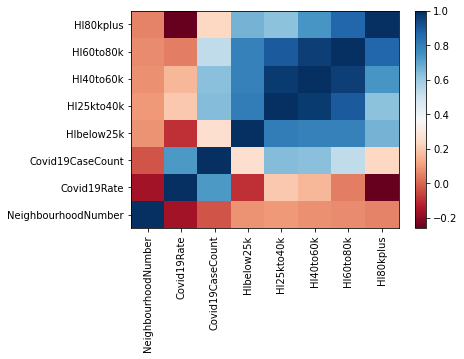

In [18]:
fig, ax = plt.subplots()
im = ax.pcolor(corr_hi2, cmap='RdBu')

#label names
row_labels = corr_hi2.columns
col_labels = corr_hi2.index

#move ticks and labels to the center
ax.set_xticks(np.arange(corr_hi2.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(corr_hi2.shape[0]) + 0.5, minor=False)

#insert labels
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

#rotate label if too long
plt.xticks(rotation=90)

fig.colorbar(im)
plt.show()

In [20]:
#generate a map with population with household income over 80k
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfhi2['HI80kplus'].min(),
                              dfhi2['HI80kplus'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
popHHI100kmap = folium.Map(location=[latitude, longitude], zoom_start=11.25)
popHHI100kmap.choropleth(
    geo_data=Toronto_geo,
    data=dfhi2,
    columns=['NeighbourhoodNumber', 'HI80kplus'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Population of with Household Income > $80,000 per Neighbourhood',
    reset=True
    )
popHHI100kmap

In [4]:
#examine correaltion 
corr_hi=dfhi.corr()
corr_hi

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,HI0to5k,HI5to10k,HI10to15k,H$20to25k,HI25to30k,HI30to35k,HI35to40k,HI40to45k,HI45to50k,HI50to60k,HI60to70k,HI70to80k,HI80to90k,HI990to100k,HIover100k
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.024919,0.131937,0.142856,0.070411,0.109824,0.087735,0.092321,0.093751,0.081409,0.079507,0.070141,0.074888,0.074377,0.082521,0.047594
Covid19Rate,-0.160640,1.000000,0.730923,-0.204670,-0.088641,-0.045859,0.103557,0.161657,0.219674,0.221621,0.194210,0.182534,0.134600,0.070196,0.019934,-0.007580,-0.035199,-0.330093
Covid19CaseCount,-0.027007,0.730923,1.000000,0.078905,0.225222,0.267947,0.508491,0.601582,0.654599,0.669627,0.645490,0.641605,0.617993,0.550660,0.503524,0.477822,0.445426,0.152718
HI0to5k,0.024919,-0.204670,0.078905,1.000000,0.819522,0.703780,0.636177,0.615604,0.561863,0.576647,0.572362,0.587509,0.613115,0.641923,0.659238,0.658480,0.644115,0.578090
HI5to10k,0.131937,-0.088641,0.225222,0.819522,1.000000,0.964969,0.828981,0.764058,0.719623,0.731710,0.721879,0.715635,0.721657,0.725966,0.723126,0.709936,0.698783,0.551677
HI10to15k,0.142856,-0.045859,0.267947,0.703780,0.964969,1.000000,0.875814,0.796804,0.765535,0.769738,0.760416,0.752958,0.741439,0.731823,0.717782,0.702262,0.687486,0.516124
H$20to25k,0.070411,0.103557,0.508491,0.636177,0.828981,0.875814,1.000000,0.953373,0.952808,0.948104,0.940717,0.931685,0.912438,0.883770,0.853924,0.834915,0.806462,0.567602
HI25to30k,0.109824,0.161657,0.601582,0.615604,0.764058,0.796804,0.953373,1.000000,0.982006,0.976368,0.968027,0.957917,0.939289,0.900137,0.866498,0.841647,0.806344,0.531268
HI30to35k,0.087735,0.219674,0.654599,0.561863,0.719623,0.765535,0.952808,0.982006,1.000000,0.987736,0.978146,0.966130,0.943173,0.899848,0.861154,0.833954,0.797297,0.509427
HI35to40k,0.092321,0.221621,0.669627,0.576647,0.731710,0.769738,0.948104,0.976368,0.987736,1.000000,0.985557,0.978290,0.963230,0.923465,0.888036,0.862640,0.828839,0.549154


### no correlations above 0.22.  Note that lowest correlation is with incomeover 100k

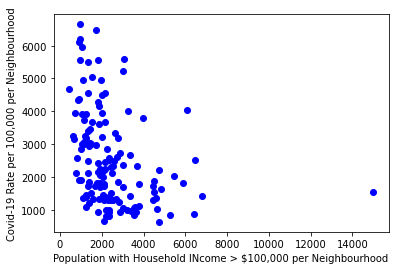

In [5]:
#scatterplot high correlation population
plt.scatter(dfhi.HIover100k, dfhi.Covid19Rate,  color='blue')
plt.xlabel("Population with Household INcome > $100,000 per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.show()

(0.0, 7215.837722455667)

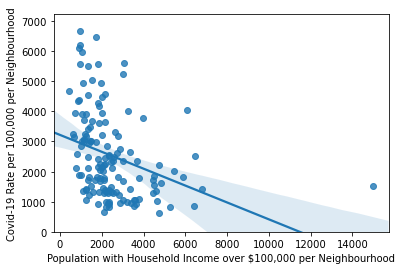

In [13]:
# HIover100k as a predictor of COVID-19 infections
sns.regplot(x="HIover100k", y="Covid19Rate", data=dfhi)
plt.xlabel("Population with Household Income over $100,000 per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

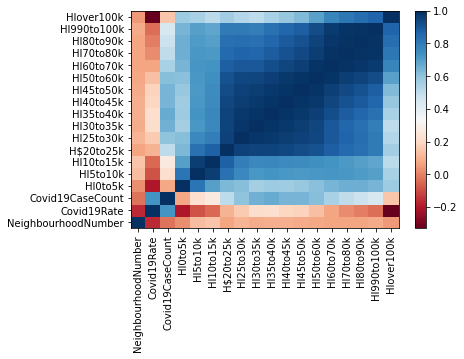

In [12]:
fig, ax = plt.subplots()
im = ax.pcolor(corr_hi, cmap='RdBu')

#label names
row_labels = corr_hi.columns
col_labels = corr_hi.index

#move ticks and labels to the center
ax.set_xticks(np.arange(corr_hi.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(corr_hi.shape[0]) + 0.5, minor=False)

#insert labels
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

#rotate label if too long
plt.xticks(rotation=90)

fig.colorbar(im)
plt.show()

In [10]:
#generate a map with population with household income over 100k
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfhi['HIover100k'].min(),
                              dfhi['HIover100k'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
popHHI100kmap = folium.Map(location=[latitude, longitude], zoom_start=11.25)
popHHI100kmap.choropleth(
    geo_data=Toronto_geo,
    data=dfhi,
    columns=['NeighbourhoodNumber', 'HIover100k'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Population of with Household Income > $100,000 per Neighbourhood',
    reset=True
    )
popHHI100kmap

# age distribution

In [31]:
#import COVID and demographic data, age subset
dfage=pd.read_csv('neighbourhood-profiles-2016age.csv')

In [32]:
dfage

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,PopDenskm2,zeroto14,15to25,25to54,55to64,65p,old85p
0,Agincourt North,129,2109.023460,614,3929,3840,3705,11305,4230,6045,925
1,Agincourt South-Malvern West,128,2134.107842,507,3034,3075,3360,9965,3265,4105,555
2,Alderwood,20,1800.232288,217,2435,1760,1235,5220,1825,2015,320
3,Annex,95,1821.398152,556,10863,2360,3750,15040,3480,5910,1040
4,Banbury-Don Mills,42,1346.813504,373,2775,3605,2730,10810,3555,6975,1640
...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,8541,1860,1320,6420,1595,3150,880
136,Yonge-Eglinton,100,981.636625,116,7162,1800,1225,5860,1325,1600,165
137,Yonge-St.Clair,97,941.890166,118,10708,1210,920,5960,1540,2905,470
138,York University Heights,27,4943.282717,1364,2086,4045,4750,12290,2965,3530,400


In [33]:
#examine correaltion 
corr_age=dfage.corr()
corr_age

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,PopDenskm2,zeroto14,15to25,25to54,55to64,65p,old85p
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.134765,0.084416,0.095214,0.105294,0.152000,0.086340,-0.001463
Covid19Rate,-0.160640,1.000000,0.730923,-0.156828,0.328797,0.227361,-0.004847,0.117611,0.102973,0.092297
Covid19CaseCount,-0.027007,0.730923,1.000000,-0.106867,0.793926,0.731509,0.509923,0.668184,0.583868,0.402375
PopDenskm2,0.134765,-0.156828,-0.106867,1.000000,-0.159763,0.018470,0.199651,-0.111350,-0.172060,-0.190155
zeroto14,0.084416,0.328797,0.793926,-0.159763,1.000000,0.785450,0.595164,0.843553,0.730530,0.516881
15to25,0.095214,0.227361,0.731509,0.018470,0.785450,1.000000,0.817883,0.850548,0.747622,0.488091
25to54,0.105294,-0.004847,0.509923,0.199651,0.595164,0.817883,1.000000,0.759807,0.622164,0.385147
55to64,0.152000,0.117611,0.668184,-0.111350,0.843553,0.850548,0.759807,1.000000,0.909071,0.677622
65p,0.086340,0.102973,0.583868,-0.172060,0.730530,0.747622,0.622164,0.909071,1.000000,0.883376
old85p,-0.001463,0.092297,0.402375,-0.190155,0.516881,0.488091,0.385147,0.677622,0.883376,1.000000


In [34]:
corr_age2=corr_age.drop('PopDenskm2',axis=1)
corr_age2

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,zeroto14,15to25,25to54,55to64,65p,old85p
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.084416,0.095214,0.105294,0.152000,0.086340,-0.001463
Covid19Rate,-0.160640,1.000000,0.730923,0.328797,0.227361,-0.004847,0.117611,0.102973,0.092297
Covid19CaseCount,-0.027007,0.730923,1.000000,0.793926,0.731509,0.509923,0.668184,0.583868,0.402375
PopDenskm2,0.134765,-0.156828,-0.106867,-0.159763,0.018470,0.199651,-0.111350,-0.172060,-0.190155
zeroto14,0.084416,0.328797,0.793926,1.000000,0.785450,0.595164,0.843553,0.730530,0.516881
15to25,0.095214,0.227361,0.731509,0.785450,1.000000,0.817883,0.850548,0.747622,0.488091
25to54,0.105294,-0.004847,0.509923,0.595164,0.817883,1.000000,0.759807,0.622164,0.385147
55to64,0.152000,0.117611,0.668184,0.843553,0.850548,0.759807,1.000000,0.909071,0.677622
65p,0.086340,0.102973,0.583868,0.730530,0.747622,0.622164,0.909071,1.000000,0.883376
old85p,-0.001463,0.092297,0.402375,0.516881,0.488091,0.385147,0.677622,0.883376,1.000000


<Figure size 2880x1440 with 0 Axes>

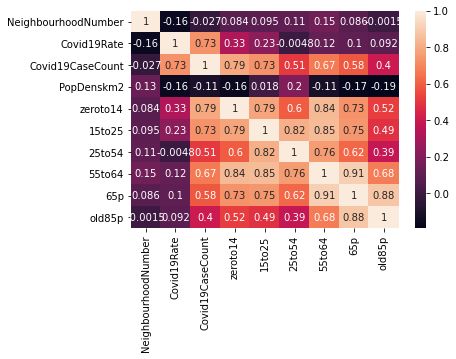

<Figure size 2880x1440 with 0 Axes>

In [27]:
#heatmap correaltion
sns.heatmap(corr_age, annot=True)

plt.figure(figsize=(40, 20))

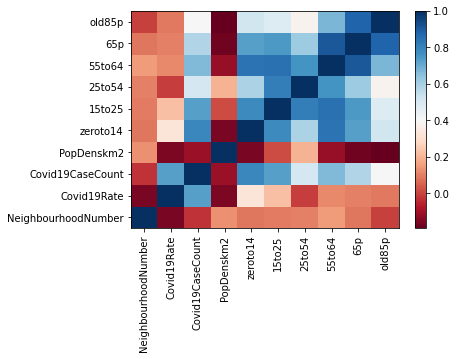

In [36]:
fig, ax = plt.subplots()
im = ax.pcolor(corr_age, cmap='RdBu')

#label names
row_labels = corr_age.columns
col_labels = corr_age.index

#move ticks and labels to the center
ax.set_xticks(np.arange(corr_age.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(corr_age.shape[0]) + 0.5, minor=False)

#insert labels
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

#rotate label if too long
plt.xticks(rotation=90)

fig.colorbar(im)
plt.show()

### strongest correlations in COVID19 rate with ages:  0-14, then 15-25.  School age.  Low positive correlations in 65+, 85+ 

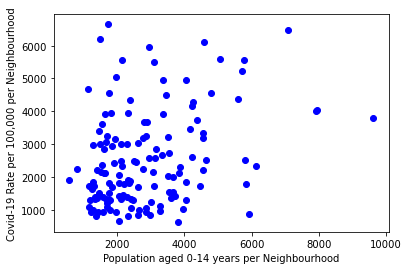

In [38]:
#scatterplot high correlation population
plt.scatter(dfage.zeroto14, dfhi.Covid19Rate,  color='blue')
plt.xlabel("Population aged 0-14 years per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.show()

(0.0, 6951.81029244)

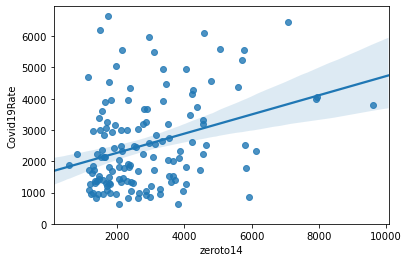

In [46]:
# Engine size as potential predictor variable of price
sns.regplot(x="zeroto14", y="Covid19Rate", data=dfage)
plt.ylim(0,)

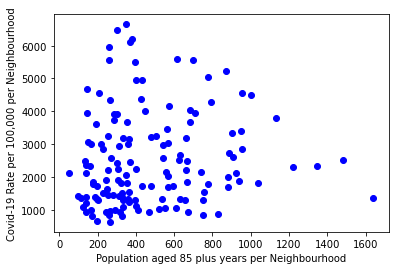

In [39]:
#scatterplot low correlation population
plt.scatter(dfage.old85p, dfhi.Covid19Rate,  color='blue')
plt.xlabel("Population aged 85 plus years per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.show()

## type of home

In [40]:
#import COVID and demographic data, home subset
dfh=pd.read_csv('neighbourhood-profiles-2016home.csv')

In [41]:
dfh

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,DetachedHouse,Apartment5plusStory,OtherAttahced,MovableHome
0,Agincourt North,129,2109.023460,614,3345,2120,3645,5
1,Agincourt South-Malvern West,128,2134.107842,507,2790,3145,2200,0
2,Alderwood,20,1800.232288,217,2840,255,1525,0
3,Annex,95,1821.398152,556,645,8165,7125,0
4,Banbury-Don Mills,42,1346.813504,373,3485,6270,2370,0
...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,920,1295,3680,0
136,Yonge-Eglinton,100,981.636625,116,1400,1995,2275,0
137,Yonge-St.Clair,97,941.890166,118,520,4315,2175,0
138,York University Heights,27,4943.282717,1364,1235,5505,3430,0


In [42]:
#examine correaltion 
corr_h=dfh.corr()
corr_h

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,DetachedHouse,Apartment5plusStory,OtherAttahced,MovableHome
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.096862,0.000419,0.145154,0.077159
Covid19Rate,-0.160640,1.000000,0.730923,0.003767,-0.046036,-0.089347,0.066792
Covid19CaseCount,-0.027007,0.730923,1.000000,0.317295,0.271418,0.212604,0.081827
DetachedHouse,0.096862,0.003767,0.317295,1.000000,-0.153199,0.017749,0.064259
Apartment5plusStory,0.000419,-0.046036,0.271418,-0.153199,1.000000,-0.054636,-0.082457
OtherAttahced,0.145154,-0.089347,0.212604,0.017749,-0.054636,1.000000,0.219204
MovableHome,0.077159,0.066792,0.081827,0.064259,-0.082457,0.219204,1.000000


no significant correlation between COVID19 rate and type of home

## commute time to work

In [14]:
#import COVID and demographic data, commute subset
dfc=pd.read_csv('neighbourhood-profiles-2016commute.csv')

In [15]:
dfc

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,TravelWorkCarTruckVanDriver,TravelWorkCarTruckVanPassenger,TravelWorkPublicTransit,TravelWorkWalk,TravelWorkBicycle,TravelWorkOther,CommunteWorkUnder15m,CommunteWork15to29m,CommunteWork30to44m,CommunteWork45to59m,CommunteWorkOVer60m
0,Agincourt North,129,2109.023460,614,7155,930,3350,265,70,45,1610,3175,2940,1410,2670
1,Agincourt South-Malvern West,128,2134.107842,507,6135,665,2985,280,35,65,1455,2735,2515,1230,2230
2,Alderwood,20,1800.232288,217,4090,355,1285,195,65,65,1210,1815,1495,630,895
3,Annex,95,1821.398152,556,3290,290,6200,3200,1675,225,2330,6260,4000,1410,905
4,Banbury-Don Mills,42,1346.813504,373,7150,500,2945,615,65,140,1695,3475,3110,1540,1565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,2190,195,3005,525,610,55,585,2020,2355,915,720
136,Yonge-Eglinton,100,981.636625,116,1970,155,2935,635,145,90,695,1765,2215,795,470
137,Yonge-St.Clair,97,941.890166,118,2050,155,3170,715,155,95,780,2265,2195,630,460
138,York University Heights,27,4943.282717,1364,5945,665,5405,585,115,75,1365,3280,3430,1605,3095


In [16]:
#examine correaltion 
corr_c=dfc.corr()
corr_c

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,TravelWorkCarTruckVanDriver,TravelWorkCarTruckVanPassenger,TravelWorkPublicTransit,TravelWorkWalk,TravelWorkBicycle,TravelWorkOther,CommunteWorkUnder15m,CommunteWork15to29m,CommunteWork30to44m,CommunteWork45to59m,CommunteWorkOVer60m
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,-0.000657,0.123513,0.185420,0.050968,0.129265,0.058187,0.039201,0.039786,0.112297,0.106505,0.188807
Covid19Rate,-0.160640,1.000000,0.730923,0.182877,0.340197,-0.006803,-0.160179,-0.342851,-0.159550,-0.037147,-0.073534,-0.092121,0.007071,0.366423
Covid19CaseCount,-0.027007,0.730923,1.000000,0.679372,0.779379,0.485448,0.062639,-0.170352,0.270076,0.394574,0.383937,0.427393,0.497506,0.809363
TravelWorkCarTruckVanDriver,-0.000657,0.182877,0.679372,1.000000,0.889157,0.615583,0.113467,-0.122696,0.468466,0.549792,0.576455,0.709205,0.800874,0.873100
TravelWorkCarTruckVanPassenger,0.123513,0.340197,0.779379,0.889157,1.000000,0.535840,0.048197,-0.099335,0.347910,0.455570,0.485238,0.588916,0.649473,0.895862
TravelWorkPublicTransit,0.185420,-0.006803,0.485448,0.615583,0.535840,1.000000,0.482301,0.376963,0.737471,0.684368,0.764568,0.933732,0.868858,0.651228
TravelWorkWalk,0.050968,-0.160179,0.062639,0.113467,0.048197,0.482301,1.000000,0.516084,0.757993,0.868056,0.843161,0.542923,0.251802,0.094675
TravelWorkBicycle,0.129265,-0.342851,-0.170352,-0.122696,-0.099335,0.376963,0.516084,1.000000,0.569886,0.375461,0.477825,0.422669,0.156043,-0.128859
TravelWorkOther,0.058187,-0.159550,0.270076,0.468466,0.347910,0.737471,0.757993,0.569886,1.000000,0.837174,0.888960,0.820142,0.612817,0.363905
CommunteWorkUnder15m,0.039201,-0.037147,0.394574,0.549792,0.455570,0.684368,0.868056,0.375461,0.837174,1.000000,0.963073,0.749428,0.551911,0.482234


(0.0, 6951.81029244)

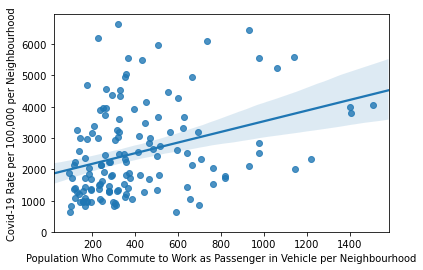

In [46]:
# type of commute as a predictor of COVID-19 infections
sns.regplot(x="TravelWorkCarTruckVanPassenger", y="Covid19Rate", data=dfc)
plt.xlabel("Population Who Commute to Work as Passenger in Vehicle per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

(0.0, 6951.81029244)

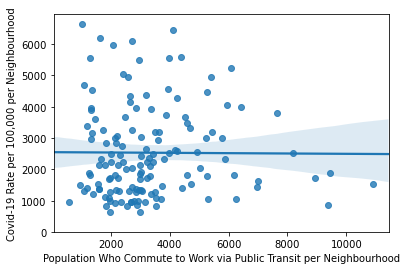

In [45]:
# type of commute as a predictor of COVID-19 infections
sns.regplot(x="TravelWorkPublicTransit", y="Covid19Rate", data=dfc)
plt.xlabel("Population Who Commute to Work via Public Transit per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

(0.0, 6951.81029244)

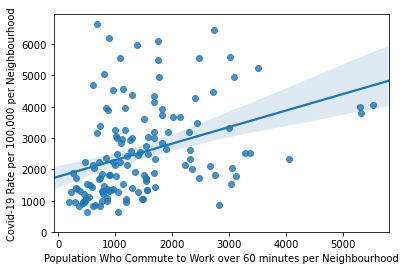

In [42]:
# distance of commute as a predictor of COVID-19 infections
sns.regplot(x="CommunteWorkOVer60m", y="Covid19Rate", data=dfc)
plt.xlabel("Population Who Commute to Work over 60 minutes per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

(0.0, 7032.50968024106)

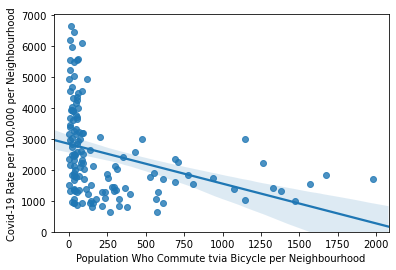

In [43]:
# distance of commute as a predictor of COVID-19 infections
sns.regplot(x="TravelWorkBicycle", y="Covid19Rate", data=dfc)
plt.xlabel("Population Who Commute to Work via Bicycle per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

### highest correlation of COVID19 is for car, truck, van passenger and for commute over 60 m.  These factors also correlate with each other.  Lowest correaltion for this who cycle

In [20]:
#generate a map with population with longest commutes to work
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfc['TravelWorkCarTruckVanPassenger'].min(),
                              dfc['TravelWorkCarTruckVanPassenger'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
poplongcommutemap = folium.Map(location=[latitude, longitude], zoom_start=11.45)
poplongcommutemap.choropleth(
    geo_data=Toronto_geo,
    data=dfc,
    columns=['NeighbourhoodNumber', 'TravelWorkCarTruckVanPassenger'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Population who Commute to Work as Vehicle Passenger (not Public Transit) per Neighbourhood',
    reset=True
    )
poplongcommutemap

In [ ]:
### some correaltion to map of where cases are highest anyway

# consider employment status

In [2]:
#import COVID and demographic data, employment subset
dfem=pd.read_csv('neighbourhood-profiles-2016employment.csv')

In [3]:
dfem

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,EmploymentRate,UnemploymentRate,ParticipationRateMale,EmploymentRateMale,UnemploymentRateMales,ParticipationRateFemale,EmploymentRateFemales,UnemploymenRrateFemale
0,Agincourt North,129,2109.023460,614,50.0,9.8,59.8,54.5,9.0,51.5,46.0,10.6
1,Agincourt South-Malvern West,128,2134.107842,507,53.2,9.8,63.8,58.2,8.8,54.6,48.7,10.8
2,Alderwood,20,1800.232288,217,62.4,6.1,71.1,67.1,5.4,62.1,57.9,6.8
3,Annex,95,1821.398152,556,65.8,6.7,74.0,68.9,6.9,67.6,63.1,6.7
4,Banbury-Don Mills,42,1346.813504,373,55.6,7.2,66.2,62.0,6.4,54.7,50.2,8.2
...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,65.6,5.2,73.3,68.9,5.7,65.6,62.8,4.3
136,Yonge-Eglinton,100,981.636625,116,68.2,6.9,76.8,72.6,5.5,70.0,64.3,8.3
137,Yonge-St.Clair,97,941.890166,118,65.2,5.9,76.9,72.5,5.6,63.6,59.6,6.2
138,York University Heights,27,4943.282717,1364,56.3,10.7,67.6,60.8,9.9,58.6,51.8,11.5


In [4]:
#examine correaltion 
corr_em=dfem.corr()
corr_em

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,EmploymentRate,UnemploymentRate,ParticipationRateMale,EmploymentRateMale,UnemploymentRateMales,ParticipationRateFemale,EmploymentRateFemales,UnemploymenRrateFemale
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.044850,0.091673,0.045548,0.026922,0.063273,0.084901,0.058068,0.108929
Covid19Rate,-0.160640,1.000000,0.730923,-0.518157,0.605126,-0.484831,-0.536827,0.575337,-0.449866,-0.491326,0.554502
Covid19CaseCount,-0.027007,0.730923,1.000000,-0.376483,0.486920,-0.311161,-0.358895,0.440890,-0.341443,-0.378809,0.467604
EmploymentRate,0.044850,-0.518157,-0.376483,1.000000,-0.765290,0.952365,0.966923,-0.709184,0.974371,0.984218,-0.723019
UnemploymentRate,0.091673,0.605126,0.486920,-0.765290,1.000000,-0.649702,-0.751666,0.929887,-0.668294,-0.752725,0.951319
ParticipationRateMale,0.045548,-0.484831,-0.311161,0.952365,-0.649702,1.000000,0.985717,-0.605634,0.891429,0.891594,-0.607683
EmploymentRateMale,0.026922,-0.536827,-0.358895,0.966923,-0.751666,0.985717,1.000000,-0.729304,0.894871,0.907457,-0.682296
UnemploymentRateMales,0.063273,0.575337,0.440890,-0.709184,0.929887,-0.605634,-0.729304,1.000000,-0.614339,-0.674549,0.774133
ParticipationRateFemale,0.084901,-0.449866,-0.341443,0.974371,-0.668294,0.891429,0.894871,-0.614339,1.000000,0.990904,-0.634433
EmploymentRateFemales,0.058068,-0.491326,-0.378809,0.984218,-0.752725,0.891594,0.907457,-0.674549,0.990904,1.000000,-0.731129


<Figure size 2880x1440 with 0 Axes>

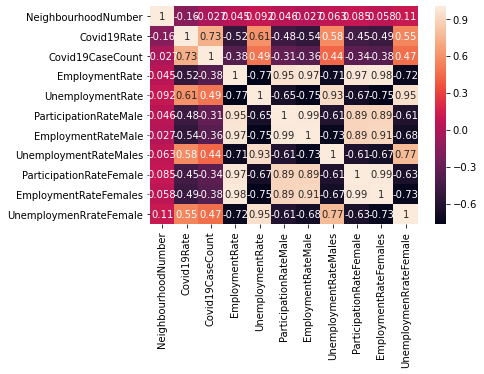

<Figure size 2880x1440 with 0 Axes>

In [52]:
#heatmap correaltion
sns.heatmap(corr_em, annot=True)

plt.figure(figsize=(40, 20))

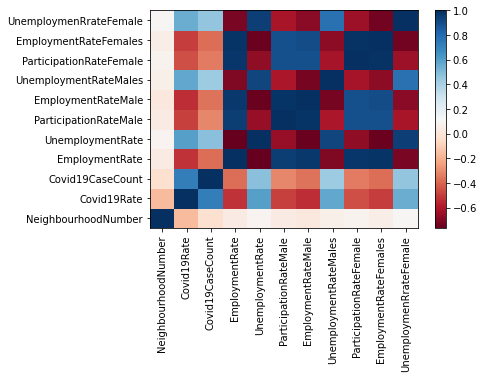

In [25]:
fig, ax = plt.subplots()
im = ax.pcolor(corr_em, cmap='RdBu')

#label names
row_labels = corr_em.columns
col_labels = corr_em.index

#move ticks and labels to the center
ax.set_xticks(np.arange(corr_em.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(corr_em.shape[0]) + 0.5, minor=False)

#insert labels
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

#rotate label if too long
plt.xticks(rotation=90)

fig.colorbar(im)
plt.show()

(0.0, 7036.414926054562)

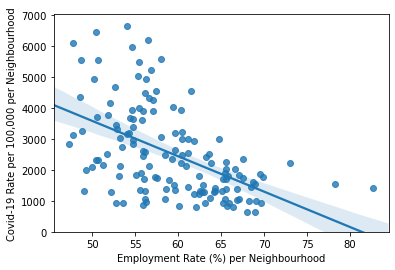

In [8]:
# employment as a predictor of COVID-19 infections
sns.regplot(x="EmploymentRate", y="Covid19Rate", data=dfem)
plt.xlabel("Employment Rate (%) per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

(0.0, 6977.037778960117)

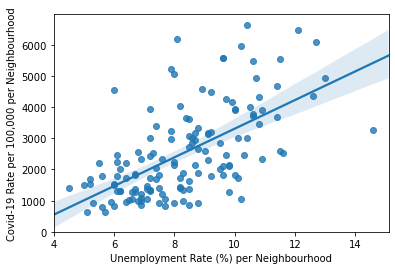

In [9]:
# employment as a predictor of COVID-19 infections
sns.regplot(x="UnemploymentRate", y="Covid19Rate", data=dfem)
plt.xlabel("Unemployment Rate (%) per Neighbourhood")
plt.ylabel("Covid-19 Rate per 100,000 per Neighbourhood")
plt.ylim(0,)

In [26]:
#generate a map with population unemployed
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfem['UnemploymentRate'].min(),
                              dfem['UnemploymentRate'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
unemploymap = folium.Map(location=[latitude, longitude], zoom_start=11.45)
unemploymap.choropleth(
    geo_data=Toronto_geo,
    data=dfem,
    columns=['NeighbourhoodNumber', 'UnemploymentRate'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Unemployment Rate per Neighbourhood',
    reset=True
    )
unemploymap

### unemployment is a signficant factor, high correaltions of COVID19 rate and unemployment rate, more so unemployment rate male than female, but both high.  Lowest correaltion with employment rate male

## education

In [10]:
#import COVID and demographic data, education subset
dfedu=pd.read_csv('neighbourhood-profiles-2016education.csv')

In [11]:
dfedu

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,A25to64NoCert,A25to64HSdip,A25to64Trade,A25to64non-uniDip,A25to64UniDipbelowBach,A25to64UniBachorhigher
0,Agincourt North,129,2109.023460,614,3335,4240,520,2550,570,4240
1,Agincourt South-Malvern West,128,2134.107842,507,1860,3410,460,2340,485,4615
2,Alderwood,20,1800.232288,217,795,1825,445,1735,195,1980
3,Annex,95,1821.398152,556,450,2060,365,2005,385,12640
4,Banbury-Don Mills,42,1346.813504,373,610,2265,400,2420,560,8060
...,...,...,...,...,...,...,...,...,...,...
135,Wychwood,94,1693.497805,243,645,1370,285,1345,270,4000
136,Yonge-Eglinton,100,981.636625,116,135,680,165,935,195,5070
137,Yonge-St.Clair,97,941.890166,118,140,900,210,975,195,4980
138,York University Heights,27,4943.282717,1364,2270,3875,920,2915,610,4625


In [12]:
#examine correaltion 
corr_edu=dfedu.corr()
corr_edu

,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,A25to64NoCert,A25to64HSdip,A25to64Trade,A25to64non-uniDip,A25to64UniDipbelowBach,A25to64UniBachorhigher
NeighbourhoodNumber,1.000000,-0.160640,-0.027007,0.153996,0.161269,0.035144,0.123852,0.073049,0.049681
Covid19Rate,-0.160640,1.000000,0.730923,0.549743,0.396639,0.516382,0.195973,0.138330,-0.333046
Covid19CaseCount,-0.027007,0.730923,1.000000,0.789387,0.842695,0.834501,0.703064,0.611061,0.113294
A25to64NoCert,0.153996,0.549743,0.789387,1.000000,0.838260,0.782549,0.602416,0.428030,-0.063383
A25to64HSdip,0.161269,0.396639,0.842695,0.838260,1.000000,0.901064,0.913138,0.785114,0.325465
A25to64Trade,0.035144,0.516382,0.834501,0.782549,0.901064,1.000000,0.849815,0.683586,0.202607
A25to64non-uniDip,0.123852,0.195973,0.703064,0.602416,0.913138,0.849815,1.000000,0.871692,0.574935
A25to64UniDipbelowBach,0.073049,0.138330,0.611061,0.428030,0.785114,0.683586,0.871692,1.000000,0.680738
A25to64UniBachorhigher,0.049681,-0.333046,0.113294,-0.063383,0.325465,0.202607,0.574935,0.680738,1.000000


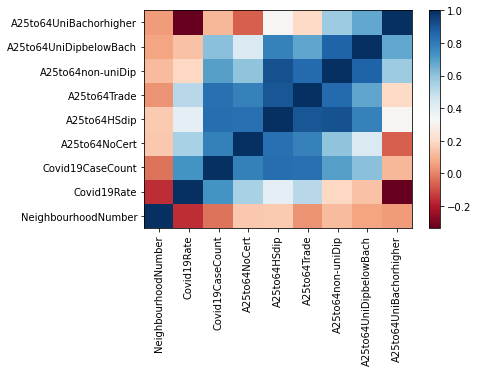

In [13]:
fig, ax = plt.subplots()
im = ax.pcolor(corr_edu, cmap='RdBu')

#label names
row_labels = corr_edu.columns
col_labels = corr_edu.index

#move ticks and labels to the center
ax.set_xticks(np.arange(corr_edu.shape[1]) + 0.5, minor=False)
ax.set_yticks(np.arange(corr_edu.shape[0]) + 0.5, minor=False)

#insert labels
ax.set_xticklabels(row_labels, minor=False)
ax.set_yticklabels(col_labels, minor=False)

#rotate label if too long
plt.xticks(rotation=90)

fig.colorbar(im)
plt.show()

In [28]:
#generate a map with highest education
# create a numpy array of length 6 and has linear spacing to determine min and max COVID-19 infection rates per 100,000 for optimal colour scaling
threshold_scale = np.linspace(dfedu['A25to64UniBachorhigher'].min(),
                              dfedu['A25to64UniBachorhigher'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# let Folium determine the scale.
edumap = folium.Map(location=[latitude, longitude], zoom_start=11.45)
edumap.choropleth(
    geo_data=Toronto_geo,
    data=dfedu,
    columns=['NeighbourhoodNumber', 'A25to64UniBachorhigher'],
    key_on='feature.properties.AREA_SHORT_CODE',
    threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population with Education Univeristy Bachelor or Higher per Neighbourhood',
    reset=True
    )
edumap

## correlation of COVID19 rate and adults 25-64 with below high school, next highest trades workers.  Lowest correlation for those with Bachelor degree or higher

# Foursquare Queries of Specific Neighbourhoods

### goal is to see if venues with very high or very low COVID rates have any venues in common.  Maybe lots of outdoor venues in neighbourhoods with low COVID rates?  People can do outdoor things which should make virus harder to spread?


In [11]:
#look at visible minority data again, it has the critical columns with neighbourhoods and rates
dfvm.head()

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,VMAboriginal,VMLatinAmerica,VMSouthAsian,VMChinese,VMBlack,VMFilipino,VMArab,VMSoutheastAsian,VMWestAsian,VMKorean,VMJapanese,VMNotSpecified,VMMultiple,VMNot
0,Agincourt North,129,2109.023460,614,30,170,5315,16460,1340,1420,275,260,125,70,60,245,630,2465
1,Agincourt South-Malvern West,128,2134.107842,507,70,230,4190,11110,1545,1280,300,155,375,140,40,275,490,3320
2,Alderwood,20,1800.232288,217,180,180,540,275,300,615,90,55,20,65,35,140,180,9535
3,Annex,95,1821.398152,556,255,405,1125,2145,935,350,300,190,340,605,255,125,480,21380
4,Banbury-Don Mills,42,1346.813504,373,115,350,2825,4630,970,1135,550,110,755,560,210,155,470,14290


In [48]:
#drop some columns for ease of analysis
dfcovid=dfvm[['Neighbourhood','NeighbourhoodNumber','Covid19Rate','Covid19CaseCount']]
dfcovid

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount
0,Agincourt North,129,2109.023460,614
1,Agincourt South-Malvern West,128,2134.107842,507
2,Alderwood,20,1800.232288,217
3,Annex,95,1821.398152,556
4,Banbury-Don Mills,42,1346.813504,373
...,...,...,...,...
135,Wychwood,94,1693.497805,243
136,Yonge-Eglinton,100,981.636625,116
137,Yonge-St.Clair,97,941.890166,118
138,York University Heights,27,4943.282717,1364


In [49]:
#new df with top 10 neighbourhoods with high infection rates
covidrateh=dfcovid.nlargest(10, ['Covid19Rate']) 
covidrateh

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount
117,Thistletown-Beaumond Heights,3,6650.579151,689
81,Mount Olive-Silverstone-Jamestown,2,6463.555259,2130
74,Maple Leaf,29,6201.167046,627
13,Black Creek,24,6095.597369,1325
55,Humbermede,22,5969.765198,928
124,West Humber-Clairville,1,5586.575408,1861
54,Humber Summit,21,5565.399485,691
45,Glenfield-Jane Heights,25,5559.017415,1695
126,Weston,113,5491.329480,988
33,Downsview-Roding-CFB,26,5232.226406,1834


In [50]:
#new df with top 10 neighbourhoods with low infection rates
covidratel=dfcovid.nsmallest(10, ['Covid19Rate']) 
covidratel

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount
116,The Beaches,63,625.956322,135
106,Runnymede-Bloor West Village,89,645.481629,65
44,Forest Hill South,101,810.659709,87
133,Woodbine Corridor,64,813.332270,102
104,Rosedale-Moore Park,98,831.620704,174
82,Mount Pleasant East,99,846.497764,142
129,Willowdale East,51,854.582226,431
69,Lawrence Park South,103,935.502998,142
85,Newtonbrook East,50,938.062993,151
16,Bridle Path-Sunnybrook-York Mills,41,938.916469,87


In [18]:
#read a file with latitude and longitude for each neighbourhood (top 5 and bottom 5 covid rates)
df10latlong=pd.read_csv('neighbourhood-profiles-201610latlong.csv')
df10latlong

,Neighbourhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,Population2016,Latitude,Longitude
0,Runnymede-Bloor West Village,89,645.481629,65,10070,43.660060,-79.480015
1,Woodbine Corridor,64,813.332270,102,12541,43.666740,-79.314851
2,The Beaches,63,625.956322,135,21567,43.666740,-79.314851
3,Rosedale-Moore Park,98,831.620704,174,20923,43.675323,-79.363391
4,Forest Hill South,101,810.659709,87,10732,43.700993,-79.425562
5,Maple Leaf,29,6201.167046,627,10111,43.720097,-79.492490
6,Thistletown-Beaumond Heights,3,6650.579151,689,10360,43.733835,-79.577515
7,Humbermede,22,5969.765198,928,15545,43.736402,-79.526280
8,Mount Olive-Silverstone-Jamestown,2,6463.555259,2130,32954,43.757861,-79.603381
9,Black Creek,24,6095.597369,1325,21737,43.772688,-79.534881


In [19]:
#define my Foursquare credentials
CLIENT_ID = '4W2EB5EZAMTUNRAL0RL0PDKESLM1EOP205SZUAFSQTPP4JCS' # your Foursquare ID
CLIENT_SECRET = '1RDOKYAULPXWVJMTA1TJBIE3STCJZ0P1KTMFXIIME15UNQSI' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 4W2EB5EZAMTUNRAL0RL0PDKESLM1EOP205SZUAFSQTPP4JCS
CLIENT_SECRET:1RDOKYAULPXWVJMTA1TJBIE3STCJZ0P1KTMFXIIME15UNQSI


In [20]:
#Foursquare search for venues, get url for Foursquare query.  Uses lat long for Toronto defined earlier
LIMIT=100
radius =500
#create URL

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
url 

'https://api.foursquare.com/v2/venues/explore?&client_id=4W2EB5EZAMTUNRAL0RL0PDKESLM1EOP205SZUAFSQTPP4JCS&client_secret=1RDOKYAULPXWVJMTA1TJBIE3STCJZ0P1KTMFXIIME15UNQSI&v=20180605&ll=43.6534817,-79.3839347&radius=500&limit=100'

In [21]:
#run this query
results = requests.get(url).json()
#results

In [22]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [23]:
#creates the data fame of venue, category, and lat and long

venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  """


,name,categories,lat,lng
0,Downtown Toronto,Neighborhood,43.653232,-79.385296
1,Nathan Phillips Square,Plaza,43.652270,-79.383516
2,Japango,Sushi Restaurant,43.655268,-79.385165
3,Poke Guys,Poke Place,43.654895,-79.385052
4,Chatime 日出茶太,Bubble Tea Shop,43.655542,-79.384684


In [25]:
#function to query Foursquare for venues and to make a df with neighborhoods and lat long
def getNearbyVenues(names, latitudes, longitudes, radius=400):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [26]:
#run the function
toronto_venues = getNearbyVenues(names=df10latlong['Neighbourhood'],
                                   latitudes=df10latlong['Latitude'],
                                   longitudes=df10latlong['Longitude'])

Runnymede-Bloor West Village
Woodbine Corridor
The Beaches
Rosedale-Moore Park
Forest Hill South
Maple Leaf
Thistletown-Beaumond Heights
Humbermede
Mount Olive-Silverstone-Jamestown
Black Creek


In [52]:
#look at df
toronto_venues

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Runnymede-Bloor West Village,43.660060,-79.480015,Grillway Subs and Burgers,43.660032,-79.479937,Diner
1,Runnymede-Bloor West Village,43.660060,-79.480015,Buddha Pie,43.661597,-79.479499,Pizza Place
2,Runnymede-Bloor West Village,43.660060,-79.480015,Westwood Grill,43.659962,-79.479757,Asian Restaurant
3,Runnymede-Bloor West Village,43.660060,-79.480015,Crème Fraîche Market Cafe,43.659399,-79.482775,Café
4,Runnymede-Bloor West Village,43.660060,-79.480015,JP Sushi,43.660230,-79.479805,Sushi Restaurant
...,...,...,...,...,...,...,...
84,Black Creek,43.772688,-79.534881,Extended Stay Deluxe,43.772456,-79.538898,Hotel
85,Black Creek,43.772688,-79.534881,Tim Hortons,43.774118,-79.530458,Coffee Shop
86,Black Creek,43.772688,-79.534881,McDonald's,43.774045,-79.530902,Fast Food Restaurant
87,Black Creek,43.772688,-79.534881,Hwy 400 at Steeles Ave. W.,43.772690,-79.535007,Intersection


In [78]:
#how many venues per neighbourhood?
toronto_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Black Creek,5,5,5,5,5,5
Forest Hill South,18,18,18,18,18,18
Humbermede,3,3,3,3,3,3
Maple Leaf,3,3,3,3,3,3
Mount Olive-Silverstone-Jamestown,4,4,4,4,4,4
Rosedale-Moore Park,7,7,7,7,7,7
Runnymede-Bloor West Village,8,8,8,8,8,8
The Beaches,19,19,19,19,19,19
Thistletown-Beaumond Heights,3,3,3,3,3,3


In [80]:
#prepare df to show in bar chart
venue_count=toronto_venues.groupby('Neighborhood').count()
#venue_count.reset_index(drop=True)
venue_count2=venue_count[['Venue']]
venue_count2.rename(columns = {'Venue':'Number of Venues'}, inplace = True) 
venue_count2.sort_values(by=['Number of Venues'], inplace=True)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


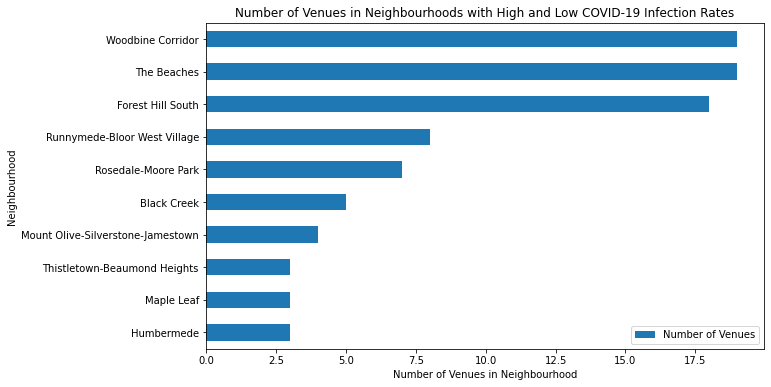

In [84]:
#plot venue data, neighbourhoods with top 5 and top 10 infections
venue_count2.plot(kind='barh', figsize=(10, 6))

plt.xlabel('Number of Venues in Neighbourhood') # add to x-label to the plot
plt.ylabel('Neighbourhood') # add y-label to the plot
plt.title('Number of Venues in Neighbourhoods with High and Low COVID-19 Infection Rates') # add title to the plot

plt.show()

### 5 nieghbourhoods with most venues have lowest infection rates.  Why?  Venues gives people the opportunity to leave the house and do things?  Is getting out of the house good for reducing COVID rates?

In [29]:
# one hot encoding
toronto_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
toronto_onehot['Neighborhood'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
totonto_onehot = toronto_onehot[fixed_columns]

toronto_onehot.head()

,Asian Restaurant,Bagel Shop,Bank,Baseball Field,Breakfast Spot,Café,Caribbean Restaurant,Coffee Shop,Construction & Landscaping,Convenience Store,...,Pharmacy,Pizza Place,Pub,Restaurant,Sandwich Place,Steakhouse,Sushi Restaurant,Tennis Court,Trail,Neighborhood
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Runnymede-Bloor West Village
1,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,Runnymede-Bloor West Village
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Runnymede-Bloor West Village
3,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Runnymede-Bloor West Village
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,Runnymede-Bloor West Village


In [30]:
#group rows by neighborhood and by taking the mean of the frequency of occurrence of each category
toronto_group = toronto_onehot.groupby('Neighborhood').mean().reset_index()
toronto_group.head()

,Neighborhood,Asian Restaurant,Bagel Shop,Bank,Baseball Field,Breakfast Spot,Café,Caribbean Restaurant,Coffee Shop,Construction & Landscaping,...,Pet Store,Pharmacy,Pizza Place,Pub,Restaurant,Sandwich Place,Steakhouse,Sushi Restaurant,Tennis Court,Trail
0,Black Creek,0.0,0.000000,0.000000,0.00,0.0,0.0,0.00,0.200000,0.0,...,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
1,Forest Hill South,0.0,0.111111,0.055556,0.00,0.0,0.0,0.00,0.055556,0.0,...,0.0,0.055556,0.111111,0.0,0.111111,0.055556,0.0,0.055556,0.000000,0.055556
2,Humbermede,0.0,0.000000,0.000000,0.00,0.0,0.0,0.00,0.333333,0.0,...,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
3,Maple Leaf,0.0,0.000000,0.000000,0.00,0.0,0.0,0.00,0.000000,0.0,...,0.0,0.333333,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.333333,0.000000
4,Mount Olive-Silverstone-Jamestown,0.0,0.000000,0.000000,0.25,0.0,0.0,0.25,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000


In [31]:
#function to show most common venues
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [32]:
#show most common venues by neighbourhood
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = toronto_group['Neighborhood']

for ind in np.arange(toronto_group.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_group.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Black Creek,Hotel,Intersection,Fast Food Restaurant,Coffee Shop,Home Service,Department Store,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop
1,Forest Hill South,Bagel Shop,Restaurant,Pizza Place,Trail,Optical Shop,Dance Studio,Intersection,Korean Restaurant,Coffee Shop,Middle Eastern Restaurant
2,Humbermede,Golf Course,Coffee Shop,Department Store,Trail,Dance Studio,Gym,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant
3,Maple Leaf,Tennis Court,Pharmacy,Park,Convenience Store,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant,Diner
4,Mount Olive-Silverstone-Jamestown,Park,Baseball Field,Caribbean Restaurant,Dance Studio,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant,Diner


In [33]:
neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Black Creek,Hotel,Intersection,Fast Food Restaurant,Coffee Shop,Home Service,Department Store,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop
1,Forest Hill South,Bagel Shop,Restaurant,Pizza Place,Trail,Optical Shop,Dance Studio,Intersection,Korean Restaurant,Coffee Shop,Middle Eastern Restaurant
2,Humbermede,Golf Course,Coffee Shop,Department Store,Trail,Dance Studio,Gym,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant
3,Maple Leaf,Tennis Court,Pharmacy,Park,Convenience Store,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant,Diner
4,Mount Olive-Silverstone-Jamestown,Park,Baseball Field,Caribbean Restaurant,Dance Studio,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant,Diner
5,Rosedale-Moore Park,Coffee Shop,Intersection,Breakfast Spot,Pizza Place,Fish & Chips Shop,Fast Food Restaurant,Trail,Department Store,Golf Course,Gastropub
6,Runnymede-Bloor West Village,Asian Restaurant,Sushi Restaurant,Food & Drink Shop,Pizza Place,Café,Diner,Coffee Shop,Market,Dance Studio,Gastropub
7,The Beaches,Fast Food Restaurant,Pizza Place,Park,Steakhouse,Sandwich Place,Italian Restaurant,Gym,Light Rail Station,Liquor Store,Movie Theater
8,Thistletown-Beaumond Heights,Convenience Store,Construction & Landscaping,Home Service,Bank,Baseball Field,Gym,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop
9,Woodbine Corridor,Fast Food Restaurant,Pizza Place,Park,Steakhouse,Sandwich Place,Italian Restaurant,Gym,Light Rail Station,Liquor Store,Movie Theater


In [45]:
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors

In [35]:
# set number of clusters
kclusters = 5

toronto_clusters = toronto_group.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_clusters)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([1, 1, 3, 4, 0, 1, 1, 1, 2, 1], dtype=int32)

In [36]:
df10latlong = df10latlong.rename(columns={'Neighbourhood': 'Neighborhood'}, index={'ONE': 'one'})
df10latlong

,Neighborhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,Population2016,Latitude,Longitude
0,Runnymede-Bloor West Village,89,645.481629,65,10070,43.660060,-79.480015
1,Woodbine Corridor,64,813.332270,102,12541,43.666740,-79.314851
2,The Beaches,63,625.956322,135,21567,43.666740,-79.314851
3,Rosedale-Moore Park,98,831.620704,174,20923,43.675323,-79.363391
4,Forest Hill South,101,810.659709,87,10732,43.700993,-79.425562
5,Maple Leaf,29,6201.167046,627,10111,43.720097,-79.492490
6,Thistletown-Beaumond Heights,3,6650.579151,689,10360,43.733835,-79.577515
7,Humbermede,22,5969.765198,928,15545,43.736402,-79.526280
8,Mount Olive-Silverstone-Jamestown,2,6463.555259,2130,32954,43.757861,-79.603381
9,Black Creek,24,6095.597369,1325,21737,43.772688,-79.534881


In [37]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

toronto_merged = df10latlong

# merge toronto_group with df4 to add latitude/longitude for each neighborhood
toronto_merged = toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

toronto_merged.head() # check the last columns!

,Neighborhood,NeighbourhoodNumber,Covid19Rate,Covid19CaseCount,Population2016,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Runnymede-Bloor West Village,89,645.481629,65,10070,43.660060,-79.480015,1,Asian Restaurant,Sushi Restaurant,Food & Drink Shop,Pizza Place,Café,Diner,Coffee Shop,Market,Dance Studio,Gastropub
1,Woodbine Corridor,64,813.332270,102,12541,43.666740,-79.314851,1,Fast Food Restaurant,Pizza Place,Park,Steakhouse,Sandwich Place,Italian Restaurant,Gym,Light Rail Station,Liquor Store,Movie Theater
2,The Beaches,63,625.956322,135,21567,43.666740,-79.314851,1,Fast Food Restaurant,Pizza Place,Park,Steakhouse,Sandwich Place,Italian Restaurant,Gym,Light Rail Station,Liquor Store,Movie Theater
3,Rosedale-Moore Park,98,831.620704,174,20923,43.675323,-79.363391,1,Coffee Shop,Intersection,Breakfast Spot,Pizza Place,Fish & Chips Shop,Fast Food Restaurant,Trail,Department Store,Golf Course,Gastropub
4,Forest Hill South,101,810.659709,87,10732,43.700993,-79.425562,1,Bagel Shop,Restaurant,Pizza Place,Trail,Optical Shop,Dance Studio,Intersection,Korean Restaurant,Coffee Shop,Middle Eastern Restaurant


In [88]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]
print(rainbow)

['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000']


In [47]:
# add markers to the map and plot
markers_colors = []
for lat, lon, poi, cluster in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Neighborhood'], toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    try:
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[int(cluster-1)],
            fill=True,
            fill_color=rainbow[int(cluster-1)],
            fill_opacity=0.7).add_to(map_clusters)
    except:
        continue
map_clusters

In [40]:
# make a df for stuff in cluster 1

toronto_merged.loc[toronto_merged['Cluster Labels'] == 0, toronto_merged.columns[[1] + list(range(5, toronto_merged.shape[1]))]]

,NeighbourhoodNumber,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
8,2,43.757861,-79.603381,0,Park,Baseball Field,Caribbean Restaurant,Dance Studio,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant,Diner


In [41]:
# make a df for stuff in cluster 2

toronto_merged.loc[toronto_merged['Cluster Labels'] == 1, toronto_merged.columns[[1] + list(range(5, toronto_merged.shape[1]))]]

,NeighbourhoodNumber,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,89,43.660060,-79.480015,1,Asian Restaurant,Sushi Restaurant,Food & Drink Shop,Pizza Place,Café,Diner,Coffee Shop,Market,Dance Studio,Gastropub
1,64,43.666740,-79.314851,1,Fast Food Restaurant,Pizza Place,Park,Steakhouse,Sandwich Place,Italian Restaurant,Gym,Light Rail Station,Liquor Store,Movie Theater
2,63,43.666740,-79.314851,1,Fast Food Restaurant,Pizza Place,Park,Steakhouse,Sandwich Place,Italian Restaurant,Gym,Light Rail Station,Liquor Store,Movie Theater
3,98,43.675323,-79.363391,1,Coffee Shop,Intersection,Breakfast Spot,Pizza Place,Fish & Chips Shop,Fast Food Restaurant,Trail,Department Store,Golf Course,Gastropub
4,101,43.700993,-79.425562,1,Bagel Shop,Restaurant,Pizza Place,Trail,Optical Shop,Dance Studio,Intersection,Korean Restaurant,Coffee Shop,Middle Eastern Restaurant
9,24,43.772688,-79.534881,1,Hotel,Intersection,Fast Food Restaurant,Coffee Shop,Home Service,Department Store,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop


In [42]:
# make a df for stuff in cluster 3

toronto_merged.loc[toronto_merged['Cluster Labels'] == 2, toronto_merged.columns[[1] + list(range(5, toronto_merged.shape[1]))]]

,NeighbourhoodNumber,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,3,43.733835,-79.577515,2,Convenience Store,Construction & Landscaping,Home Service,Bank,Baseball Field,Gym,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop


In [43]:
# make a df for stuff in cluster 4

toronto_merged.loc[toronto_merged['Cluster Labels'] == 3, toronto_merged.columns[[1] + list(range(5, toronto_merged.shape[1]))]]

,NeighbourhoodNumber,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
7,22,43.736402,-79.52628,3,Golf Course,Coffee Shop,Department Store,Trail,Dance Studio,Gym,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant


In [44]:
# make a df for stuff in cluster 5

toronto_merged.loc[toronto_merged['Cluster Labels'] == 4, toronto_merged.columns[[1] + list(range(5, toronto_merged.shape[1]))]]

,NeighbourhoodNumber,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,29,43.720097,-79.49249,4,Tennis Court,Pharmacy,Park,Convenience Store,Golf Course,Gastropub,Food & Drink Shop,Fish & Chips Shop,Fast Food Restaurant,Diner
